# Detección de tumores en MRI cerebral y segmentación de los mismos

Se importan las librerías utilizadas

In [1]:
from __future__ import print_function
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display

import os
import random
import math

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import cv2
from skimage import io

import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, CSVLogger
from tensorflow.keras import backend as K

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

from IPython.display import display

%matplotlib inline

In [2]:
# Por comodidad a la hora de visualizar los dataframes
pd.options.display.max_colwidth= 200
pd.options.display.max_rows = 100

Se carga el csv con la información de los pacientes (datos genómicos e información personal)

In [3]:
patients_dir = "archive/kaggle_3m/"
mri_df = pd.read_csv(patients_dir + "data.csv")
mri_df.head()

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0


Además de este csv, se dispone de las imágenes de cada paciente y sus máscaras con los tumores segmentados
### Resumen
- Análisis exploratorio
    - Información inicial
    - Preparación de los datos
    - Visualización de las imágenes y las máscaras
    - Visualización general del conjunto de datos
- Modelo de detección    
    - Creación del modelo
    - Entrenamiento del modelo
    - Guardado del modelo
    - Evaluación del modelo
- Sistema de detección + segmentación

# Análisis exploratorio
## Información inicial

In [4]:
print("Número de pacientes x Features recopiladas")
mri_df.shape

Número de pacientes x Features recopiladas


(110, 18)

In [5]:
mri_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

## Preparación de los datos
En primer lugar, se va a añadir una columna al dataframe obtenido del csv que contiene los nombres de las instituciones de las que proceden las imágenes de cada paciente.

En segundo lugar, para facilitar la lectura de las imágenes, se va a crear un dataframe con las rutas de las imágenes, las de sus máscaras y el id de su paciente correspondiente. Además, se añade una última columna al dataframe, el diagnóstico. Es posible saberlo gracias a la máscara (binaria).

Los tumores se segmentan en color blanco (1), mientras que cualquier otro tejido sano está representado en negro (0) en la máscara. Por tanto, si el valor máximo de la máscara no es 0, en esa imágen se habrá detectado un tumor cerebral y se etiquetará como diagnóstico Positivo. En caso contrario, el diagnóstico será Negativo.

Una vez se tengan todos los datos ordenados en dataframes se explorará visualmente el dataset.

Se introduce la institución de la que procede la imagen (obtenido en la documentación del dataset)

In [6]:
institution_map = {
    "TCGA_CS": "Thomas Jefferson University",
    "TCGA_DU": "Henry Ford Hospital",
    "TCGA_EZ": "UNC",
    "TCGA_FG": "Case Western",
    "TCGA_HT": "Case Western – St. Joseph’s"
}
mri_df["institution"] = mri_df.Patient.str[:7].replace(institution_map)
mri_df.head()

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01,institution
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0,Thomas Jefferson University
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0,Thomas Jefferson University
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0,Thomas Jefferson University
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0,Thomas Jefferson University
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0,Thomas Jefferson University


Se recorre la estructura de carpetas para organizar las imágenes y las máscaras en un dataframe

In [7]:
patients_info = []
root = "archive/kaggle_3m/"
for patient in os.listdir(root):
    patient_path = os.path.join(root, patient)
    if os.path.isdir(patient_path):
        for image in os.listdir(patient_path):
            image_path = os.path.join(patient_path, image)
            patients_info.extend([patient, image_path])
    else:
        continue

img_msk_paths_df = pd.DataFrame({"patient_id" : patients_info[::2],
                                "path" : patients_info[1::2]})
img_msk_paths_df

,patient_id,path
0,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_1.tif
1,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_10.tif
2,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_10_mask.tif
3,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_11.tif
4,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_11_mask.tif
...,...,...
7853,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_88.tif
7854,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_88_mask.tif
7855,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_8_mask.tif
7856,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_9.tif


Se separa el dataframe anterior en otros dos, uno que contenga únicamente las imágenes y otro que contenga únicamente las máscaras.

In [8]:
images_df = img_msk_paths_df.loc[~img_msk_paths_df.path.str.endswith("_mask.tif")].sort_values("patient_id").reset_index(drop=True)
masks_df = img_msk_paths_df.loc[img_msk_paths_df.path.str.endswith("_mask.tif")].sort_values("patient_id").reset_index(drop=True)

Buscamos tener en un mismo dataframe el id del paciente, las rutas de las imágenes y las máscaras y el diagnóstico. Para juntar las rutas de las imágenes y las máscaras debemos ordenar de igual manera los dos dataframes anteriores. Para ello, se toma el número precedente a la extensión (en el caso de las imágenes) o de "_mask.tif" en el caso de las máscaras. Como previamente se han ordenado los dataframes por el id de los pacientes, tendremos las imágenes y las máscaras en las mismas filas de los dataframes.

In [9]:
INI = 62
FIN_IMG = -4
FIN_MSK = -9

# Ejemplo de lo que se busca obtener para ordenar las filas
print(images_df.iloc[0]["path"])
print(images_df.iloc[0]["path"][INI:FIN_IMG])
print(masks_df.iloc[0]["path"])
print(masks_df.iloc[0]["path"][INI:FIN_MSK])

# Se ordenan los dataframes
imgs = sorted(images_df["path"].values, key=lambda x : int(x[INI:FIN_IMG]))
masks = sorted(masks_df["path"].values, key=lambda x : int(x[INI:FIN_MSK]))

archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_1.tif
1
archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_10_mask.tif
10


In [10]:
# Comprobación
idx = random.randint(0, len(imgs)-1)
print("Path to the Image:", imgs[idx], "\nPath to the Mask: ", masks[idx])

Path to the Image: archive/kaggle_3m/TCGA_DU_5852_19950709\TCGA_DU_5852_19950709_15.tif 
Path to the Mask:  archive/kaggle_3m/TCGA_DU_5852_19950709\TCGA_DU_5852_19950709_15_mask.tif


In [11]:
# Esta lista puede variar (hemos ejecutado el notebook en windows - \)
ids = [img.split("/")[2].split("\\")[0] for img in imgs]

In [12]:
ordered_imgs = pd.DataFrame({"patient_id": ids,
                            "img_path": imgs})
ordered_msks = pd.DataFrame({"patient_id": ids,
                            "msk_path": masks})

In [13]:
ordered_imgs = ordered_imgs.sort_values("patient_id").reset_index(drop=True)
#ordered_imgs

In [14]:
ordered_msks = ordered_msks.sort_values("patient_id").reset_index(drop=True)
#ordered_msks

In [15]:
# Comprobamos que todo sigue bien
idx = random.randint(0, len(imgs)-1)

print("Path to the Image:", ordered_imgs.iloc[idx].values[1], "\nPath to the Mask: ", ordered_msks.iloc[idx].values[1])

Path to the Image: archive/kaggle_3m/TCGA_HT_7692_19960724\TCGA_HT_7692_19960724_15.tif 
Path to the Mask:  archive/kaggle_3m/TCGA_HT_7692_19960724\TCGA_HT_7692_19960724_15_mask.tif


In [16]:
tif_data = ordered_imgs
tif_data["msk_path"] = ordered_msks["msk_path"]
tif_data

,patient_id,img_path,msk_path
0,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_1.tif,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_1_mask.tif
1,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_6.tif,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_6_mask.tif
2,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_14.tif,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_14_mask.tif
3,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_15.tif,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_15_mask.tif
4,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_16.tif,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_16_mask.tif
...,...,...,...
3924,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_14.tif,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_14_mask.tif
3925,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_62.tif,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_62_mask.tif
3926,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_46.tif,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_46_mask.tif
3927,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_61.tif,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_61_mask.tif


In [17]:
def get_diagnosis(mask_path):
    value = np.max(cv2.imread(mask_path))
    if value > 0 :
        tumor = "Positivo" # Hay tumor
    else:
        tumor = "Negativo" # No hay tumor
    return tumor

tif_data["diagnosis"] = tif_data.msk_path.apply(get_diagnosis)
tif_data

,patient_id,img_path,msk_path,diagnosis
0,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_1.tif,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_1_mask.tif,Negativo
1,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_6.tif,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_6_mask.tif,Negativo
2,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_14.tif,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_14_mask.tif,Positivo
3,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_15.tif,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_15_mask.tif,Positivo
4,TCGA_CS_4941_19960909,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_16.tif,archive/kaggle_3m/TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_16_mask.tif,Positivo
...,...,...,...,...
3924,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_14.tif,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_14_mask.tif,Negativo
3925,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_62.tif,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_62_mask.tif,Negativo
3926,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_46.tif,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_46_mask.tif,Positivo
3927,TCGA_HT_A61B_19991127,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_61.tif,archive/kaggle_3m/TCGA_HT_A61B_19991127\TCGA_HT_A61B_19991127_61_mask.tif,Negativo


## Visualización de las imágenes y de las máscaras
### Imágenes y máscaras por separado

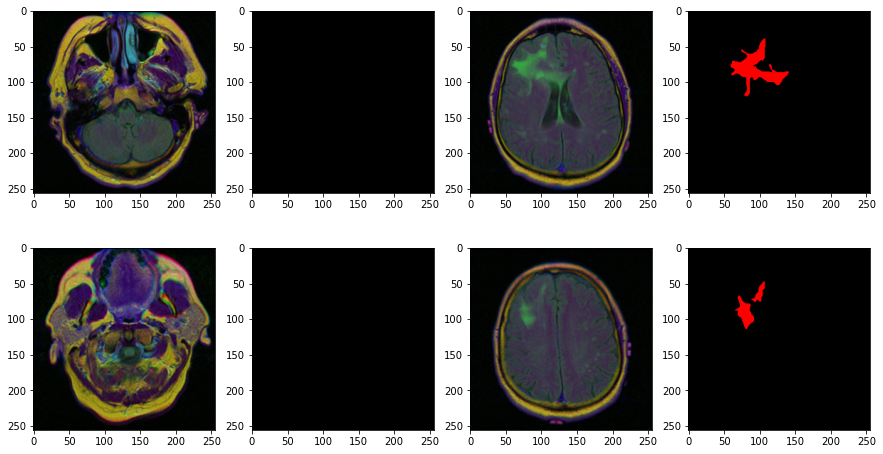

In [18]:
rows = 2
cols = 4
fig = plt.figure(figsize=(15,8))

for i in range(1,rows*cols+1):
    fig.add_subplot(rows, cols, i)
    if i % 2 != 0:
        # Imagen
        img_path = ordered_imgs.iloc[i].values[1]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) # Se cambia de BGR a RGB porque cv2 cambia los canales al leer las imágenes
        plt.imshow(img)
    else:
        # Máscara
        msk_path = ordered_msks.iloc[i-1].values[1]
        msk = cv2.imread(msk_path)
        shape = msk.shape
        msk = np.array([np.array([255, 0, 0]) if (triplet != np.array([0, 0, 0])).all() else triplet for pixel in msk for triplet in pixel]).reshape(shape)
        plt.imshow(msk, alpha=1)
plt.show()

### Imágenes y máscaras superpuestas

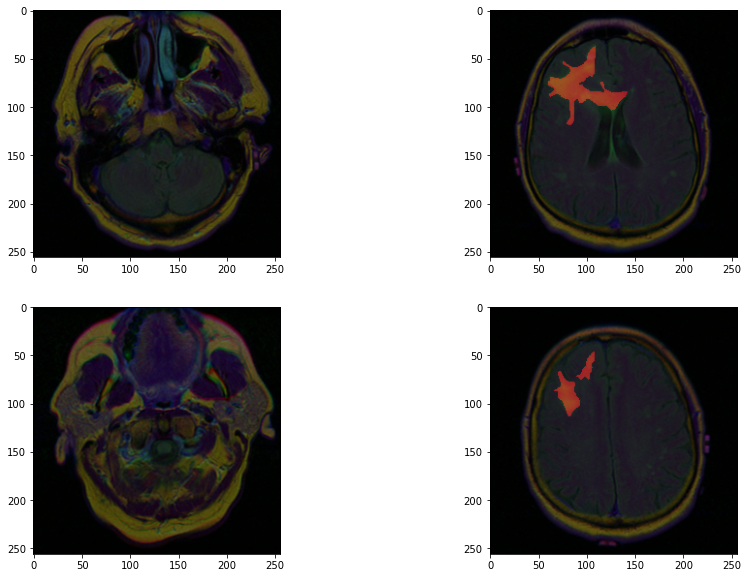

In [19]:
rows = 2
cols = 2
fig = plt.figure(figsize=(15,10))

for i in range(1,rows*cols+1):
    pos = (2 * i) - 1
    fig.add_subplot(rows, cols, i)

    img_path = ordered_imgs.iloc[pos].values[1]
    msk_path = ordered_msks.iloc[pos].values[1]

    # Imagen
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) # Se cambia de BGR a RGB porque cv2 cambia los canales al leer las imágenes
    plt.imshow(img)
    
    # Máscara
    msk = cv2.imread(msk_path)
    shape = msk.shape
    msk = np.array([np.array([255, 0, 0]) if (triplet != np.array([0, 0, 0])).all() else triplet for pixel in msk for triplet in pixel]).reshape(shape)
    plt.imshow(msk, alpha=0.5)
plt.show()

Para una exploración más completa, se ha creado una gráfica interactiva que permite observar las imágenes de cada paciente superponiendo o no las máscaras. En la columna de la izquierda se muestran las imágenes en las que se ha detectado tumor para ese paciente y en la columna de la derecha aquellas en las que no se ha diagnosticado tumor. Además, se muestra una etiqueta mostrando si el paciente sobrevivió o no al tumor.

In [20]:
@interact
def patient_plot(patient=list(tif_data["patient_id"].unique()), masks=["Include", "Exclude"]):

    if masks == "Include":
        m = True
    else:
        m = False

    patient_data = tif_data[tif_data.patient_id == patient]
    pos_diagnosis = patient_data[patient_data.diagnosis == "Positivo"].reset_index(drop=True)
    neg_diagnosis = patient_data[patient_data.diagnosis == "Negativo"].reset_index(drop=True)

    if len(pos_diagnosis) >= len(neg_diagnosis):
        max_df = pos_diagnosis
        min_df = neg_diagnosis
        more_cases = "pos"
    else:
        max_df = neg_diagnosis
        min_df = pos_diagnosis
        more_cases = "neg"

    rows = max(len(pos_diagnosis), len(neg_diagnosis))
    cols = 2
    fig = plt.figure(figsize=(25, 100))

    pat = patient[:-9]
    deathOrAlive = "Fallece" if mri_df.loc[mri_df.Patient == pat]["death01"].values[0] == 1.0 else "Sobrevive"
    print(deathOrAlive)
    #fig.suptitle("Paciente {} - {}".format(pat, deathOrAlive), fontsize=20)

    for i in range(1, rows, 2):
        if more_cases == "pos":
            # Plot positive images
            fig.add_subplot(rows, cols, i)
            img_path = max_df.iloc[i].values[1]
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) # Se cambia de BGR a RGB porque cv2 cambia los canales al leer las imágenes
            plt.imshow(img)
            if i == 1:
                plt.title("Tumor detected", fontsize=14)
            # If mask included, plot mask
            if m:
                msk_path = max_df.iloc[i].values[2]
                msk = cv2.imread(msk_path)
                shape = msk.shape
                msk = np.array([np.array([255, 0, 0]) if (triplet != np.array([0, 0, 0])).all() else triplet for pixel in msk for triplet in pixel]).reshape(shape)
                plt.imshow(msk, alpha=0.5)
            # If there are more negative images, plot them
            if i < len(min_df):
                fig.add_subplot(rows, cols, i + 1)
                img_path = min_df.iloc[i].values[1]
                img = cv2.imread(img_path)
                img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) # Se cambia de BGR a RGB porque cv2 cambia los canales al leer las imágenes
                plt.imshow(img)
                if i == 1:
                    plt.title("Tumor not detected", fontsize=14)
                # If mask included, plot mask
                if m:
                    msk_path = min_df.iloc[i].values[2]
                    msk = cv2.imread(msk_path)
                    shape = msk.shape
                    msk = np.array([np.array([255, 0, 0]) if (triplet != np.array([0, 0, 0])).all() else triplet for pixel in msk for triplet in pixel]).reshape(shape)
                    plt.imshow(msk, alpha=0.5)
            
        else:
            # Plot negative
            fig.add_subplot(rows, cols, i + 1)
            img_path = max_df.iloc[i].values[1]
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) # Se cambia de BGR a RGB porque cv2 cambia los canales al leer las imágenes
            plt.imshow(img)
            if i == 1:
                plt.title("Tumor not detected", fontsize=14)
            # If mask included, plot mask
            if m:
                msk_path = max_df.iloc[i].values[2]
                msk = cv2.imread(msk_path)
                shape = msk.shape
                msk = np.array([np.array([255, 0, 0]) if (triplet != np.array([0, 0, 0])).all() else triplet for pixel in msk for triplet in pixel]).reshape(shape)
                plt.imshow(msk, alpha=0.5)
            # If there are more positive images, plot them
            if i < len(min_df):
                fig.add_subplot(rows, cols, i)
                img_path = min_df.iloc[i].values[1]
                img = cv2.imread(img_path)
                img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) # Se cambia de BGR a RGB porque cv2 cambia los canales al leer las imágenes
                plt.imshow(img)
                if i == 1:
                    plt.title("Tumor detected", fontsize=14)
                # If mask included, plot mask
                if m:
                    msk_path = min_df.iloc[i].values[2]
                    msk = cv2.imread(msk_path)
                    shape = msk.shape
                    msk = np.array([np.array([255, 0, 0]) if (triplet != np.array([0, 0, 0])).all() else triplet for pixel in msk for triplet in pixel]).reshape(shape)
                    plt.imshow(msk, alpha=0.5)

    plt.show()

interactive(children=(Dropdown(description='patient', options=('TCGA_CS_4941_19960909', 'TCGA_CS_4942_19970222…

## Visualización general del conjunto de datos
### Distribución de los pacientes según su centro de procedencia

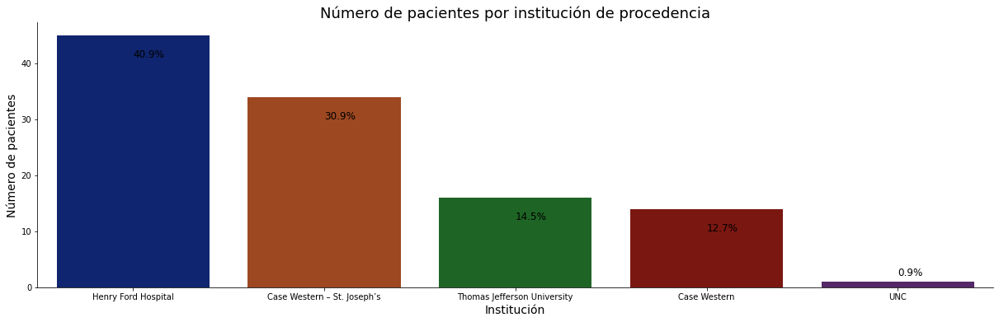

In [21]:
g = sns.catplot(x="institution", kind="count", palette="dark", data=mri_df ,height=5, aspect=30/9, order=mri_df.institution.value_counts().index)
g.set_xticklabels(rotation=0)
plt.title("Número de pacientes por institución de procedencia", fontsize=18)
plt.xlabel("Institución", fontsize=14)
plt.ylabel("Número de pacientes", fontsize=14)
plt.text(0, mri_df.institution.value_counts().values[0] - 4, str(round((mri_df.institution.value_counts().values[0] / sum(mri_df.institution.value_counts().values) * 100), 1)) + "%", fontsize=12)
plt.text(1, mri_df.institution.value_counts().values[1] - 4, str(round((mri_df.institution.value_counts().values[1] / sum(mri_df.institution.value_counts().values) * 100), 1)) + "%", fontsize=12)
plt.text(2, mri_df.institution.value_counts().values[2] - 4, str(round((mri_df.institution.value_counts().values[2] / sum(mri_df.institution.value_counts().values) * 100), 1)) + "%", fontsize=12)
plt.text(3, mri_df.institution.value_counts().values[3] - 4, str(round((mri_df.institution.value_counts().values[3] / sum(mri_df.institution.value_counts().values) * 100), 1)) + "%", fontsize=12)
plt.text(4, 2, str(round((mri_df.institution.value_counts().values[4] / sum(mri_df.institution.value_counts().values) * 100), 1)) + "%", fontsize=12)
plt.show()

### Distribución de los pacientes según si sobreviven o fallecen

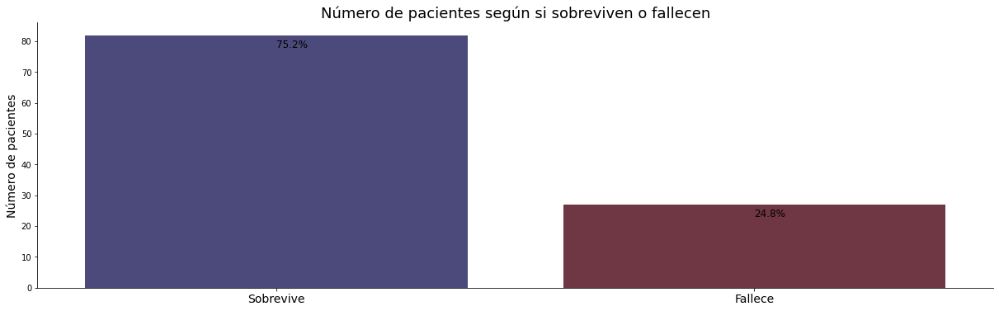

In [22]:
g = sns.catplot(x="death01", kind="count", palette="icefire", data=mri_df ,height=5, aspect=30/9, order=mri_df.death01.value_counts().index)
g.set_xticklabels(rotation=0)
plt.title("Número de pacientes según si sobreviven o fallecen", fontsize=18)
plt.xlabel("", fontsize=14)
plt.xticks(ticks=[0.0, 1.0], labels=["Sobrevive", "Fallece"], fontsize=14)
plt.ylabel("Número de pacientes", fontsize=14)
plt.text(0, mri_df.death01.value_counts().values[0] - 4, str(round((mri_df.death01.value_counts().values[0] / sum(mri_df.death01.value_counts().values)) * 100, 1)) + "%", fontsize=12)
plt.text(1, mri_df.death01.value_counts().values[1] - 4, str(round((mri_df.death01.value_counts().values[1] / sum(mri_df.death01.value_counts().values)) * 100, 1)) + "%", fontsize=12)
plt.show()

### Clasificación de las imágenes según su diagnóstico

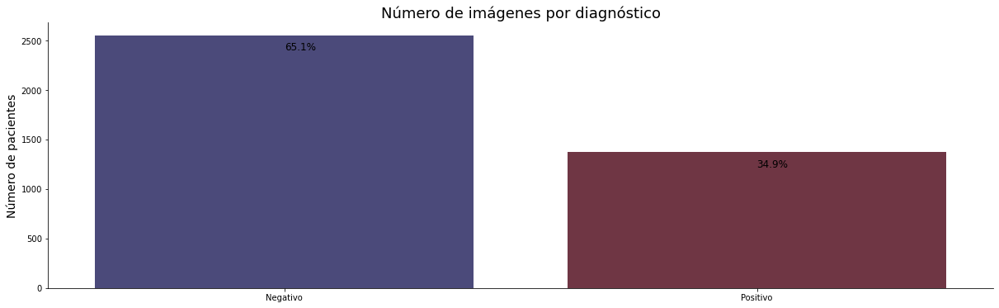

In [23]:
g = sns.catplot(x="diagnosis", kind="count", palette="icefire", data=tif_data ,height=5, aspect=30/9, order=tif_data.diagnosis.value_counts().index)
g.set_xticklabels(rotation=0)
plt.title("Número de imágenes por diagnóstico", fontsize=18)
plt.xlabel("", fontsize=14)
plt.ylabel("Número de pacientes", fontsize=14)
plt.text(0, tif_data.diagnosis.value_counts().values[0] - 150, str(round((tif_data.diagnosis.value_counts().values[0] / sum(tif_data.diagnosis.value_counts().values)) * 100, 1)) + "%", fontsize=12)
plt.text(1, tif_data.diagnosis.value_counts().values[1] - 150, str(round((tif_data.diagnosis.value_counts().values[1] / sum(tif_data.diagnosis.value_counts().values)) * 100, 1)) + "%", fontsize=12)
plt.show()

### Clasificación de las imágenes por paciente y diagnóstico

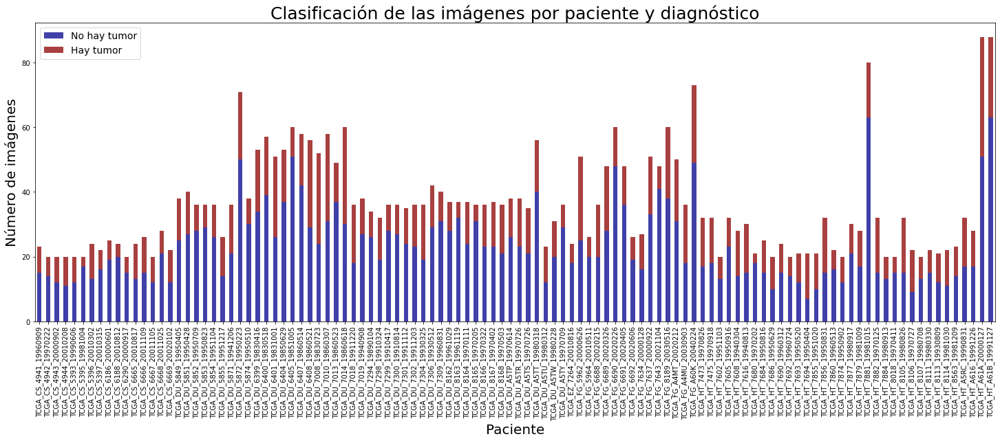

In [24]:
diagnosis_groups = tif_data.groupby(['patient_id', 'diagnosis'])['diagnosis'].size().unstack().fillna(0)

label_map = {
    "Positivo": "Hay tumor",
    "Negativo": "No hay tumor"
}
a = diagnosis_groups.columns[0]
b = diagnosis_groups.columns[1]
diagnosis_groups.columns = [label_map[a], label_map[b]]

ax = diagnosis_groups.plot(kind='bar',stacked=True,
                                figsize=(25, 8),
                                color=["darkblue", "darkred"], 
                                alpha=0.75)
ax.legend(fontsize=14);
ax.set_xlabel('Paciente', fontsize = 20)
ax.set_ylabel('Número de imágenes', fontsize = 20)
ax.set_title("Clasificación de las imágenes por paciente y diagnóstico", fontsize=25);

Hay más imágenes cuyo diagnóstico es negativo (no hay tumor, color azul) que imágenes con diagnóstico positivo.

Las gráficas mostradas hasta el momento son coherentes y muestran una distribución de los datos adecuada.
Ninguna clase queda pobremente representada.

# Modelo de detección
## Creación del modelo
Para empezar, se definen una serie de variables globales. Hemos probado varios modelos variando las EPOCHS, el BATCH_SIZE y el LEARNING_RATE.

In [25]:
# Ficheros
TRAINING_LOGS_FILE = "results/logs/training_logs.csv"
TRAINING_CHECKPOINTS_FILE= "results/checkpoints/resnet-mri-binary-weights.hdf5"
MODEL_SUMMARY_FILE = "results/model_summary.txt"
MODEL_FILE = "results/model/binary_mri_model.h5"

# Hiperparámetros
IMAGE_SIZE = 256
IMAGE_WIDTH, IMAGE_HEIGHT = IMAGE_SIZE, IMAGE_SIZE
EPOCHS = 30
BATCH_SIZE = 64
TEST_SIZE = 30
LEARNING_RATE = 0.0001

input_shape = (IMAGE_WIDTH, IMAGE_HEIGHT, 3)

Para facilidad de representación de los datos, se transforman los positivo en 1 y los negativo en 0. No pueden ser enteros, deben ser strings, ya que posteriormente utilizamos la función flow_from_dataframe para crear los generadores de datos, especificando el modo sigmoid, que requiere que la columna de clase sea un string.

In [26]:
diagnosis_map = {
    "Positivo": "1",
    "Negativo": "0"
}
try:
    tif_data["diagnosis"] = tif_data.diagnosis.replace(diagnosis_map)
    print(tif_data.info())
except:
    print("Ya has ejecutado esta celda")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   img_path    3929 non-null   object
 2   msk_path    3929 non-null   object
 3   diagnosis   3929 non-null   object
dtypes: object(4)
memory usage: 122.9+ KB
None


Se crean los conjuntos de entrenamiento, validación y test. Se guarda el conjunto de test para realizar una representación posterior de los resultados (se sobreescriben los conjuntos creados).

In [27]:
data = tif_data
train_data, test_data = train_test_split(data, test_size=0.30)
train_data, val_data = train_test_split(train_data, test_size=0.30)
test_final_data = test_data
train_data = train_data.drop(["patient_id", 'msk_path'], axis=1)
val_data = val_data.drop(["patient_id", 'msk_path'], axis=1)
test_data = test_data.drop(["patient_id", 'msk_path'], axis=1)
print(train_data.shape)
print(val_data.shape)
print(test_data.shape)

(1925, 2)
(825, 2)
(1179, 2)


Se carga el modelo base (ResNet50) y se congelan todas sus capas convolucionales.

In [28]:
basemodel = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

In [29]:
basemodel.summary()

n[0][0]          
__________________________________________________________________________________________________
conv3_block4_out (Activation)   (None, 32, 32, 512)  0           conv3_block4_add[0][0]           
__________________________________________________________________________________________________
conv4_block1_1_conv (Conv2D)    (None, 16, 16, 256)  131328      conv3_block4_out[0][0]           
__________________________________________________________________________________________________
conv4_block1_1_bn (BatchNormali (None, 16, 16, 256)  1024        conv4_block1_1_conv[0][0]        
__________________________________________________________________________________________________
conv4_block1_1_relu (Activation (None, 16, 16, 256)  0           conv4_block1_1_bn[0][0]          
__________________________________________________________________________________________________
conv4_block1_2_conv (Conv2D)    (None, 16, 16, 256)  590080      conv4_block1_1_relu[0][0] 

In [30]:
for layer in basemodel.layers:
  layers.trainable = False

Se añade de forma secuencial:
- Una capa Flatten para aplanar los datos
- 3 capas completamente conectadas para clasificar las imágenes del problema
- 1 capa de salida, con una función sigmoidal idónea para un problema binario (detectar si hay o no hay cáncer)
- Se define un dropout del 30% para evitar el sobreajuste del modelo a los datos

Por último, se compila el modelo y se guarda el resumen de su estructura en un fichero de texto.

In [32]:
model = tf.keras.models.Sequential()

model.add(basemodel)

model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(32, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(1))
model.add(Activation('sigmoid'))

model.compile(loss='binary_crossentropy',
            optimizer=Adam(lr=LEARNING_RATE),
            metrics=['accuracy'])

if not os.path.isdir("results"):
    os.mkdir("results")
with open(MODEL_SUMMARY_FILE,"w") as fh:
    model.summary(print_fn=lambda line: fh.write(line + "\n"))

## Entrenamiento del modelo

Se crean los generadores de datos. Es muy importante la etapa de data augmentation que se define. Pensamos que si se realiza zoom sobre la imagen o se desplaza horizontal o verticalmente, la parte de la imagen de interés puede salirse de la imagen y no ser detectada por el modelo, aunque haya claramente un tumor en la imagen original. En los primeros modelos que ejecutamos obtuvimos malos resultados hasta que nos dimos cuenta de esto.

In [33]:
training_data_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
    rotation_range=30,
    #width_shift_range=0.2,
    #height_shift_range=0.2,
    shear_range=0.2,
    #zoom_range=0.2, # No interesa que haga zoom, el tumor puede estar en una zona en la que no se ha hecho zoom
    #rescale=1./255,
    horizontal_flip=True,
    fill_mode='nearest')

validation_data_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input)
    #rescale=1./255)
    
test_data_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input)
    #rescale=1./255)

Se generan los datos sobre los conjuntos de entrenamiento, validación y test creados previamente.

In [34]:
train_generator=training_data_generator.flow_from_dataframe(
dataframe=train_data,
x_col='img_path',
y_col='diagnosis',
batch_size=BATCH_SIZE,
target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
shuffle=True,
class_mode="binary")


val_generator=validation_data_generator.flow_from_dataframe(
dataframe=val_data,
x_col='img_path',
y_col='diagnosis',
batch_size=BATCH_SIZE,
target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
shuffle=True,
class_mode="binary")


test_generator=test_data_generator.flow_from_dataframe(
dataframe=test_data,
x_col='img_path',
y_col='diagnosis',
batch_size=BATCH_SIZE,
target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
shuffle=False,
class_mode='binary')

Found 1925 validated image filenames belonging to 2 classes.
Found 825 validated image filenames belonging to 2 classes.
Found 1179 validated image filenames belonging to 2 classes.


Se define un early stopping para evitar sobreajuste y un logger a csv, para poder representar posteriormente los resultados del modelo. También investigamos otras opciones como guardar los checkpoints del modelo.

In [35]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=7, restore_best_weights=True)

# save the best model with least validation loss
checkpointer = ModelCheckpoint(filepath=TRAINING_CHECKPOINTS_FILE, verbose=1, save_best_only=True)

# save model loss and accuracy for train and val sets
csv_logger = CSVLogger(TRAINING_LOGS_FILE, append=False, separator=",")

Teniendo en cuenta todo lo anterior, se entrena el modelo. Se fija un número de pasos equivalente al tamaño del conjunto de datos (train o val) dividido entre el número de epochs. Se debe cumplir que el número de steps por época por el número de épocas debe ser menor o igual que el número de datos del conjunto entre el batch size (número de batches del conjunto). Es decir, debe haber disponibles en el conjunto de datos, como poco, tantos batches como steps totales.

In [47]:
history = model.fit(train_generator, steps_per_epoch=train_generator.n // BATCH_SIZE, epochs=EPOCHS, validation_data=val_generator, validation_steps=val_generator.n // BATCH_SIZE, callbacks=[csv_logger, checkpointer, earlystopping])

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 30 steps, validate for 12 steps
Epoch 1/30
29/30 [============================>.] - ETA: 15s - loss: 0.8367 - accuracy: 0.6038
Epoch 00001: val_loss improved from inf to 0.42092, saving model to resnet-mri-binary-weights.hdf5
30/30 [==============================] - 495s 16s/step - loss: 0.8249 - accuracy: 0.6093 - val_loss: 0.4209 - val_accuracy: 0.8112
Epoch 2/30
29/30 [============================>.] - ETA: 15s - loss: 0.4997 - accuracy: 0.7357
Epoch 00002: val_loss improved from 0.42092 to 0.31703, saving model to resnet-mri-binary-weights.hdf5
30/30 [==============================] - 485s 16s/step - loss: 0.5076 - accuracy: 0.7351 - val_loss: 0.3170 - val_accuracy: 0.8594
Epoch 3/30
29/30 [============================>.] - ETA: 15s - loss: 0.3563 - accuracy: 0.8269
Epoch 00003: val_loss improved from 0.31703 to 0.28358, saving model to resnet-mri-binary-weights.hdf5
30/30 [==============================] - 490s 16s/step -

## Guardado del modelo

In [48]:
model.save(MODEL_FILE)

## Evaluación del modelo

In [36]:
model = load_model(MODEL_FILE)

In [37]:
def plot_training_logs_from_csv(training_logs_path, figsize=(15,5)):

    # Se leen los datos
    training_logs_df = pd.read_csv(training_logs_path)
    
    # Se crea la figura y los ejes
    fig, ((ax2, ax1)) = plt.subplots(1, 2, figsize=figsize)

    # se fijan los tamaños de las letras
    titles_fontsize = 14
    xlabel_fontsize = 12
    ylabel_fontsize = 12

    # Se representa el acierto
    ax1.plot(training_logs_df['epoch'].values, training_logs_df['accuracy'].values, label="train")
    ax1.plot(training_logs_df['epoch'].values, training_logs_df['val_accuracy'].values, label="val")
    ax1.set_title('Model accuracy',fontsize=titles_fontsize)
    ax1.set_ylabel('accuracy',fontsize=ylabel_fontsize)
    ax1.set_xlabel('epoch',fontsize=xlabel_fontsize)
    ax1.legend()

    # Se representa el loss
    ax2.plot(training_logs_df['epoch'].values, training_logs_df['loss'].values, label="train")
    ax2.plot(training_logs_df['epoch'].values, training_logs_df['val_loss'].values, label="val")
    ax2.set_title('Model loss',fontsize=titles_fontsize)
    ax2.set_ylabel('loss',fontsize=ylabel_fontsize)
    ax2.set_xlabel('epoch',fontsize=xlabel_fontsize)
    ax2.legend()

    plt.show()

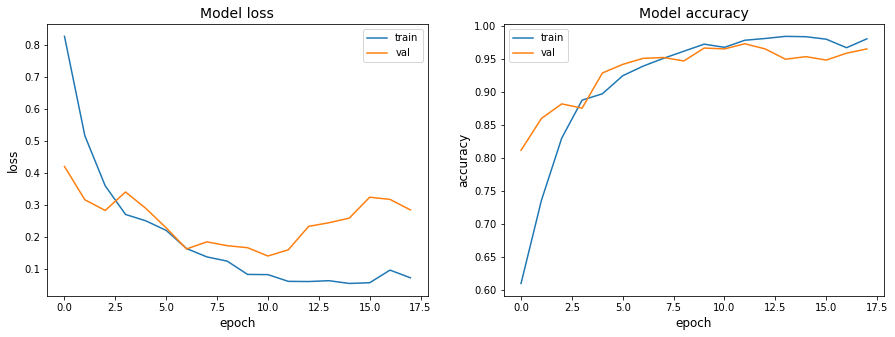

In [40]:
plot_training_logs_from_csv(TRAINING_LOGS_FILE)

### Comentario:

Nos extrañó que en algunos de los modelos que probamos el acierto del modelo era mayor para el conjunto de validación que para el conjunto de entrenamiento, para casi todas las epochs.

Además, nos llamó la atención el hecho de que el loss en el conjunto de validación aumentara a partir de la décima epoch. Esto no nos pasó solo en este modelo, sino en muchos de los que hemos probado (en las gráficas se notaba más la diferencia). También nos sorprendió que la diferencia entre los dos conjuntos en el primer tramo, 1-2 epochs, (tanto su loss como su acierto), fuera tan grande, siendo mucho mejores los valores para el conjunto de validación. Estas diferencias se pueden deber a cómo se han elaborado los conjuntos de entrenamiento, validación y test. Puede ser que el conjunto de entrenamiento tenga imágenes con patrones más complejos, las secciones donde se empieza a visualizar el tumor (su sección es más pequeña) que los patrones de las imágenes de validación. Por eso, al principio, el acierto que tiene el modelo es mucho menor en el conjunto de entrenamiento que en el de validación y a medida que se va entrenando el modelo se van equilibrando esos errores.

In [41]:
scores = model.evaluate(test_generator);
print("binary_mri_model overall accuracy on test set = ", round(scores[1],5))

  ...
    to  
  ['...']
19/19 [==============================] - 47s 2s/step - loss: 0.1116 - accuracy: 0.9712
binary_mri_model overall accuracy on test set =  0.97116


### Métricas del conjunto de test y matriz de confusión

In [42]:
original = np.asarray(test_data['diagnosis']).astype('int')
prediction = model.predict(test_generator)
pred = [1 if pred >= 0.5 else 0 for pred in prediction] # Las predicciones son la probabilidad de que cada imagen pertenezca a la clase positiva. Si esta probabilidad es mayor que 0.5, se considera que hay tumor.

0.97116
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       770
           1       0.98      0.94      0.96       409

    accuracy                           0.97      1179
   macro avg       0.97      0.96      0.97      1179
weighted avg       0.97      0.97      0.97      1179



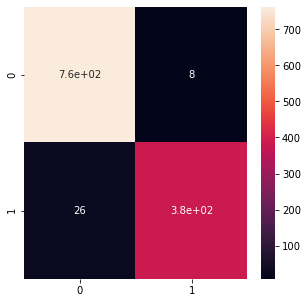

In [45]:
accuracy = accuracy_score(original, pred)
print(round(accuracy, 5))

cm = confusion_matrix(original, pred)

report = classification_report(original, pred, labels = [0, 1])
print(report)

plt.figure(figsize = (5,5))
sns.heatmap(cm, annot=True);

Área bajo la curva ROC: 0.9926


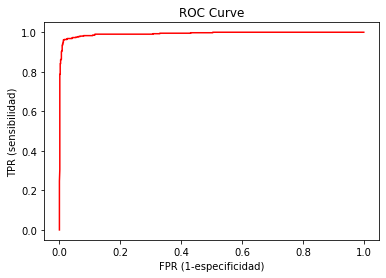

In [46]:
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(original, prediction, pos_label=1)
auc = metrics.auc(fpr, tpr)
print("Área bajo la curva ROC: {}".format(round(auc, 4)))
plt.plot(fpr,tpr,"r-")
plt.title("ROC Curve")
plt.xlabel("FPR (1-especificidad)")
plt.ylabel("TPR (sensibilidad)")
plt.show()

Como trabajo futuro se podrían obtener más imágenes de pacientes para comprobar que el modelo funciona bien, ya que las imágenes se han repartido en los conjuntos de entrenamiento, validación y test independientemente del paciente. También se podrían haber guardado las imágenes de algunos pacientes para realizar el test del modelo, excluyéndolas completamente del entrenamiento y la validación.

# Combinación del modelo de detección de tumores con un modelo ya entrenado de segmentación de los mismos

Para este apartado, hemos utilizado un modelo de segmentación realizado por un usuario de Kaggle. Intentamos implementar nuestro propio modelo de segmentación, pero no fuimos capaces de conseguir que segmentara correctamente, así que utilizamos este. La idea es detectar si hay tumor o no con nuestro modelo y, en caso de que haya, utilizar el modelo de segmentación para crear una máscara que localice el tumor en la imagen. Para ello, ejecutamos su código y guardamos el modelo, de forma que solo es necesario cargalos en este notebook y utilizarlo para realizar las predicciones.

El usuario define sus propias funciones para evaluar el modelo durante el entrenamiento. Al cargar el modelo hay que especificar dichas funciones para que no haya errores.

In [47]:
# Define a custom loss function for ResUNet model
'''
actual link for refrence (https://github.com/nabsabraham/focal-tversky-unet/blob/master/losses.py)
'''
from tensorflow.keras.losses import binary_crossentropy

epsilon = 1e-5
smooth = 1

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

Se carga el modelo de segmentación

In [49]:
model_seg = load_model("seg_mri_model.h5", custom_objects={
    'focal_tversky': focal_tversky,
    'tversky': tversky,
    'tversky_loss': tversky_loss})

Se crea una función para realizar las predicciones como se ha descrito.

In [50]:
def prediction(test, model, model_seg):

    # Listas vacías para crear un nuevo dataframe
    mask, image_id, has_mask = [], [], []
    
    # Para cada imagen del conjunto de test...
    for i in test.img_path:
        
        # Se lee la imagen
        img = io.imread(i)
        # Se convierte la imagen a numpy array
        img = np.array(img, dtype=np.float64)
        # Se hace un reshape del array para que el modelo pueda predecir sobre él (necesita forma (1, 256, 256, 3))
        img = np.reshape(img, (1,256,256,3))
        
        # Se predice si hay tumor o no en la imagen
        is_defect = model.predict(img)
        # Si la probabilidad predicha de que haya tumor es mayor que 0.5, consideramos que hay tumor (1)
        is_defect = [1 if pred >= 0.5 else 0 for pred in is_defect]

        # Creamos una nueva fila para el dataframe. En este caso no se calcula la máscara porque no se ha detectado tumor.
        if is_defect == 0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No tumor')
            continue
        
        # Se crea un array vacio con la forma de la imagen
        X = np.empty((1,256,256,3))
        # Se lee la imagen
        img = io.imread(i)
        # Se redimensiona la imagen y se transforma a numpy array
        img = cv2.resize(img, (256,256))
        img = np.array(img, dtype=np.float64)
        
        # Se estandariza la imagen
        img -= img.mean()
        img /= img.std()
        # Se redimensiona la imagen para que tenga forma (1, 256, 256, 3)
        X[0,] = img
        
        # Se hace la predicción de la máscara con el modelo de segmentación
        predict = model_seg.predict(X)
        
        # Si la suma de todos los píxeles de la máscara predicha es 0, se considera que no hay tumor, aunque el modelo de clasificación considere lo contrario
        if predict.round().astype(int).sum()==0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No tumor')
        else:
        # Si la suma de todos los píxeles de la máscara es mayor que 0, se considera que hay tumor y se devuelve la máscara
            image_id.append(i)
            has_mask.append(1)
            mask.append(predict)
            
    return pd.DataFrame({'img_path': image_id,'predicted_mask': mask,'has_mask': has_mask})

Se unen en un único dataframe el conjunto de test y las predicciones realizadas

In [51]:
df_pred = prediction(test_final_data, model, model_seg)
df_pred = test_final_data.merge(df_pred, on='img_path')
df_pred

,patient_id,img_path,msk_path,diagnosis,predicted_mask,has_mask
0,TCGA_FG_7643_20021104,archive/kaggle_3m/TCGA_FG_7643_20021104\TCGA_FG_7643_20021104_22.tif,archive/kaggle_3m/TCGA_FG_7643_20021104\TCGA_FG_7643_20021104_22_mask.tif,0,No tumor,0
1,TCGA_HT_7882_19970125,archive/kaggle_3m/TCGA_HT_7882_19970125\TCGA_HT_7882_19970125_20.tif,archive/kaggle_3m/TCGA_HT_7882_19970125\TCGA_HT_7882_19970125_20_mask.tif,1,"[[[[2.381587e-08], [6.383542e-08], [7.4460694e-08], [9.347785e-08], [2.1975771e-07], [2.9077344e-07], [4.973974e-07], [5.831192e-07], [5.018089e-07], [4.329537e-07], [4.335408e-07], [4.227429e-07]...",1
2,TCGA_DU_5855_19951217,archive/kaggle_3m/TCGA_DU_5855_19951217\TCGA_DU_5855_19951217_1.tif,archive/kaggle_3m/TCGA_DU_5855_19951217\TCGA_DU_5855_19951217_1_mask.tif,0,No tumor,0
3,TCGA_DU_7014_19860618,archive/kaggle_3m/TCGA_DU_7014_19860618\TCGA_DU_7014_19860618_41.tif,archive/kaggle_3m/TCGA_DU_7014_19860618\TCGA_DU_7014_19860618_41_mask.tif,1,"[[[[2.3754263e-08], [6.113275e-08], [6.5786324e-08], [8.0906055e-08], [1.8092575e-07], [2.3427691e-07], [3.9745035e-07], [4.4029167e-07], [3.6531134e-07], [3.0616403e-07], [3.2325372e-07], [3.1383...",1
4,TCGA_DU_A5TR_19970726,archive/kaggle_3m/TCGA_DU_A5TR_19970726\TCGA_DU_A5TR_19970726_29.tif,archive/kaggle_3m/TCGA_DU_A5TR_19970726\TCGA_DU_A5TR_19970726_29_mask.tif,0,No tumor,0
...,...,...,...,...,...,...
1174,TCGA_FG_A4MT_20020212,archive/kaggle_3m/TCGA_FG_A4MT_20020212\TCGA_FG_A4MT_20020212_42.tif,archive/kaggle_3m/TCGA_FG_A4MT_20020212\TCGA_FG_A4MT_20020212_42_mask.tif,0,No tumor,0
1175,TCGA_FG_A60K_20040224,archive/kaggle_3m/TCGA_FG_A60K_20040224\TCGA_FG_A60K_20040224_27.tif,archive/kaggle_3m/TCGA_FG_A60K_20040224\TCGA_FG_A60K_20040224_27_mask.tif,0,No tumor,0
1176,TCGA_DU_7018_19911220,archive/kaggle_3m/TCGA_DU_7018_19911220\TCGA_DU_7018_19911220_10.tif,archive/kaggle_3m/TCGA_DU_7018_19911220\TCGA_DU_7018_19911220_10_mask.tif,0,No tumor,0
1177,TCGA_DU_7010_19860307,archive/kaggle_3m/TCGA_DU_7010_19860307\TCGA_DU_7010_19860307_27.tif,archive/kaggle_3m/TCGA_DU_7010_19860307\TCGA_DU_7010_19860307_27_mask.tif,1,"[[[[2.2592365e-08], [6.080922e-08], [6.9655115e-08], [8.524399e-08], [2.002568e-07], [2.5993694e-07], [4.4285628e-07], [5.101441e-07], [4.304025e-07], [3.7030446e-07], [3.7601325e-07], [3.625003e-...",1


Se visualizan los resultados

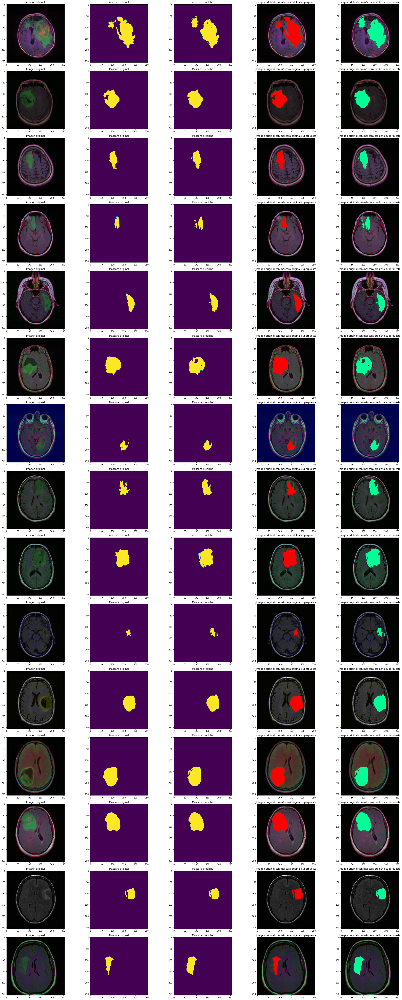

In [52]:
count = 0
fig, axs = plt.subplots(15,5, figsize=(30,70))

for i in range(len(df_pred)):
    # Para esta prueba se toman las 15 primeras imágenes para las que se ha detectado tumor

    if df_pred.has_mask[i]==1 and count<15:
        # Se representa la imagen original
        img = io.imread(df_pred.img_path[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[count][0].imshow(img)
        axs[count][0].title.set_text('Imagen original')
        
        # Se representa la máscara original
        mask = io.imread(df_pred.msk_path[i])
        axs[count][1].imshow(mask)
        axs[count][1].title.set_text('Máscara original')
        
        # Se representa la máscara predicha
        pred = np.array(df_pred.predicted_mask[i]).squeeze().round()
        axs[count][2].imshow(pred)
        axs[count][2].title.set_text('Máscara predicha')
        
        # Se superpone la máscara original a la imagen original
        img[mask==255] = (255,0,0)
        axs[count][3].imshow(img)
        axs[count][3].title.set_text('Imagen original con máscara original superpuesta')
        
        # Se superpone la máscara original a la imagen predicha
        img_ = io.imread(df_pred.img_path[i])
        img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
        img_[pred==1] = (0,255,150)
        axs[count][4].imshow(img_)
        axs[count][4].title.set_text('Imagen original con máscara predicha superpuesta')
        
        count +=1
    if (count==15):
        break

fig.tight_layout()